# Advance Lane Finding Project

This project is a part of Udacity Self-Driving Car Engineering Program. In this project, we explore different Computer Vision techniques to find and track lane line in a video.

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


![title](docs/title.png)

Summary:

1. Why do we need Camera Calibration
2. How to identify Lane Line
3. Debugging Tool

In [9]:
import cv2
import numpy as np
import glob  # to store image paths
from utils import draw_windows
from utils import CameraCalibrator, ProjectionManager, LineTracker, ImageFilter, DiagnosticMgr
from moviepy.editor import VideoFileClip
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

In [11]:
# Import test images to use during this notebook
test_path = 'test_images/'
test_imgs = glob.glob(test_path + "test*.jpg")
print(test_imgs)

['test_images/test2.jpg', 'test_images/test4.jpg', 'test_images/test16.jpg', 'test_images/test1.jpg', 'test_images/test6.jpg', 'test_images/test5.jpg', 'test_images/test8.jpg', 'test_images/test3.jpg', 'test_images/test7.jpg']


## 1. Camera Calibration

Camera calibration is a method to correct the distortion due to various factors. In this project, we focus on correction for **radial distortion, and tangential distortion.** One way is to find a **distortion coefficient matrix** of the camera using Chessboards.


![alt-text](https://cloud.githubusercontent.com/assets/13214917/23243156/ecbcf980-f931-11e6-9e3c-f47f111b689b.png)


I start by preparing "object points", which will be the (x, y, z) coordinates of the chessboard corners in the world. Here I am assuming the chessboard is fixed on the (x, y) plane at z=0, such that the object points are the same for each calibration image.  Thus, `objp` is just a replicated array of coordinates, and `objpoints` will be appended with a copy of it every time I successfully detect all chessboard corners in a test image.  `imgpoints` will be appended with the (x, y) pixel position of each of the corners in the image plane with each successful chessboard detection.  

I then used the output `objpoints` and `imgpoints` to compute the camera calibration and distortion coefficients using the `cv2.calibrateCamera()` function.  I applied this distortion correction to the test image using the `cv2.undistort()` function and obtained this result: 


Camera Calibration data restored from ./camera_cal/calibration_mat.p


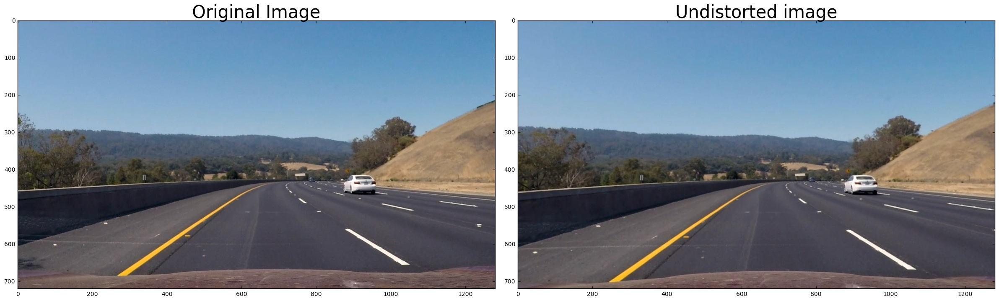

In [31]:
# Example using 1 image
frame = cv2.imread('./test_images/test3.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Calibrate camera
cam_calibration = CameraCalibrator(p_file='./camera_cal/calibration_mat.p', img_dir=None)
mtx, dst, img_size = cam_calibration.get()
row = img_size[0]
col = img_size[1]

# Un-distort image
undst_img = cv2.undistort(frame, mtx, dst)

f, ax = plt.subplots(1, 2, figsize =(24,9))
f.tight_layout()
ax[0].imshow(frame)
ax[0].set_title('Original Image', fontsize=30)
ax[1].imshow(undst_img)
ax[1].set_title('Undistorted image', fontsize=30)

plt.show()

## 2. Extract features from Image using Sobel Gradient Threshold and HLS Threshold

After we have succesfully calibrated the camera, we are going to find a way to extract only the lane lines in the image. I found that **Sobel Threshold Gradients** and **HLS Color Threshold Gradient** provide a good result.

In next sections, I will show different threshold techniques. Finally, I will combine them all into one function

### 2.1 Sobel Thresholds.

#### Asbolute Sobel Threshold

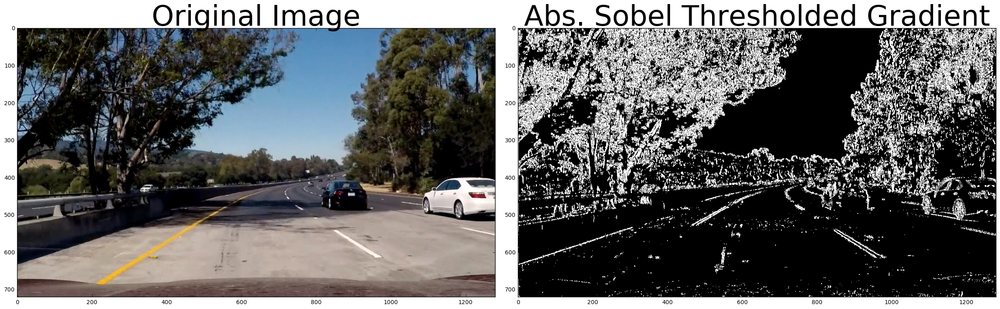

In [13]:
# Sobel Threshold
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Define a function that applies Sobel x or y,
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2, 3) Take the absolute derivative in x or y given orient = 'x' or 'y'
    abs_sobel = None
    if orient is 'x':
        abs_sobel = np.abs(cv2.Sobel(gray, ddepth=cv2.CV_64F, dx=1, dy=0))
    if orient is 'y':
        abs_sobel = np.abs(cv2.Sobel(gray, ddepth=cv2.CV_64F, dx=0, dy=1))
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    if abs_sobel is not None:
        scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
        # 5) Create a mask of 1's where the scaled gradient magnitude
        # masked everything to dark ( = 0)
        abs_sobel_output = np.zeros_like(scaled_sobel)
        # if any pixel has thresh_min < value < thresh_max
        abs_sobel_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
        return abs_sobel_output
    else:
        return None
    
# Read an image
img = cv2.imread('test_images/test5.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Run the function
grad_binary = abs_sobel_thresh(img, orient='x', thresh_min=10, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Abs. Sobel Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

####  Magnitude Sobel Threshold

In [ ]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):

    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude
    gradient_magnitude = np.sqrt(sobelx ** 2 + sobely ** 2)

    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradient_magnitude) / 255
    gradient_magnitude = np.uint8(gradient_magnitude / scale_factor)

    # 5) Create a binary mask where mag thresholds are met
    mag_binary_output = np.zeros_like(gradient_magnitude)
    mag_binary_output[(gradient_magnitude >= mag_thresh[0]) & (gradient_magnitude <= mag_thresh[1])] = 1
    return mag_binary_output

# Read an image
img = cv2.imread('test_images/test5.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Magnitude Sobel Threshold
mag_binary = mag_thresh(img, sobel_kernel=3, mag_thresh=(40, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Magnitude Sobel Thresholded Magnitude', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

#### Direction Sobel Threshold

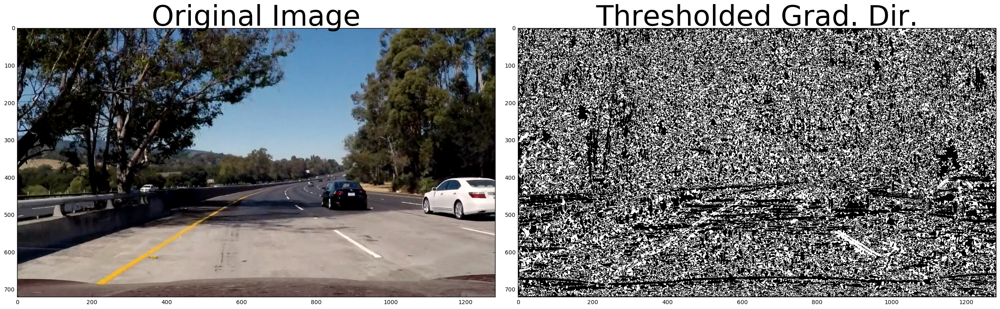

In [15]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi / 2)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.abs(sobelx)
    abs_sobely = np.abs(sobely)
    # 4) Calculate the direction of the gradient
    grad_direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    dir_binary_output = np.zeros_like(grad_direction)
    # 6) Return this mask as your binary_output image
    dir_binary_output[(grad_direction >= thresh[0]) & (grad_direction <= thresh[1])] = 1
    return dir_binary_output

# Read an image
img = cv2.imread('test_images/test5.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Direction Gradient
dir_binary = dir_threshold(img, sobel_kernel=9, thresh=(0.6, 1.3))  # 0.7 --> 1.3 is line angle around 45* -> -45*
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

In [10]:
def hls_select(img, thresh=(0, 255), channel=2):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    s_channel = hls[:, :, channel]  # default is s_channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > thresh[0]) & (s_channel < thresh[1])] = 1
    # 3) Return a binary image of threshold result
    binary_output = s_binary  # placeholder line
    return binary_output

img = cv2.imread('test_images/test5.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

s_binary = hls_select(img, thresh=(88, 250))
h_binary = hls_select(img, thresh=(120, 250),channel=1)

binimg = np.zeros_like(s_binary)
binimg[(s_binary == 1 ) & (h_binary == 1)] = 1
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(binimg, cmap='gray')
ax2.set_title('Thresholded S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

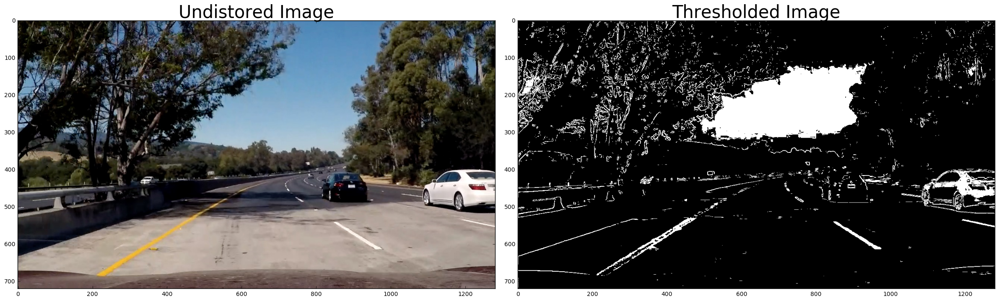

In [22]:
# Combine everything
# Example using 1 image
frame = cv2.imread('./test_images/test5.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# undst_img = cv2.undistort(frame, mtx, dst)
undst_img = frame

# Image filtering
img_filter = ImageFilter(img_size)

# undst_img = cv2.undistort(frame, mtx, dst)
binary_img = img_filter.mix_color_grad_thresh(undst_img, s_thresh=(88, 255),  h_thresh=(150, 255), grad_thresh=(60, 150))

# Display image
f, ax = plt.subplots(1, 2, figsize =(24,9))
f.tight_layout()
ax[0].imshow(undst_img)
ax[0].set_title('Undistored Image', fontsize=30)
ax[1].imshow(binary_img, cmap='gray')
ax[1].set_title('Thresholded Image', fontsize=30)
plt.show()

## 3. Perspective Transform (Bird-Eye View)

In [23]:
# Define source and destination points
offset = 300
src = np.float32([[[col * 0.05, row],                   # bottom-left
                   [col * 0.95, row],                   # bottom-right
                   [col * 0.60, row * 0.62],            # top-right
                   [col * 0.43, row * 0.62]]])          # top-left

dst = np.float32([[col*0.15 + offset, row],             # bottom left
                  [col*0.90 - offset, row],             # bottom right
                  [col- offset, 0],               # top right
                  [offset, 0]])              # top left

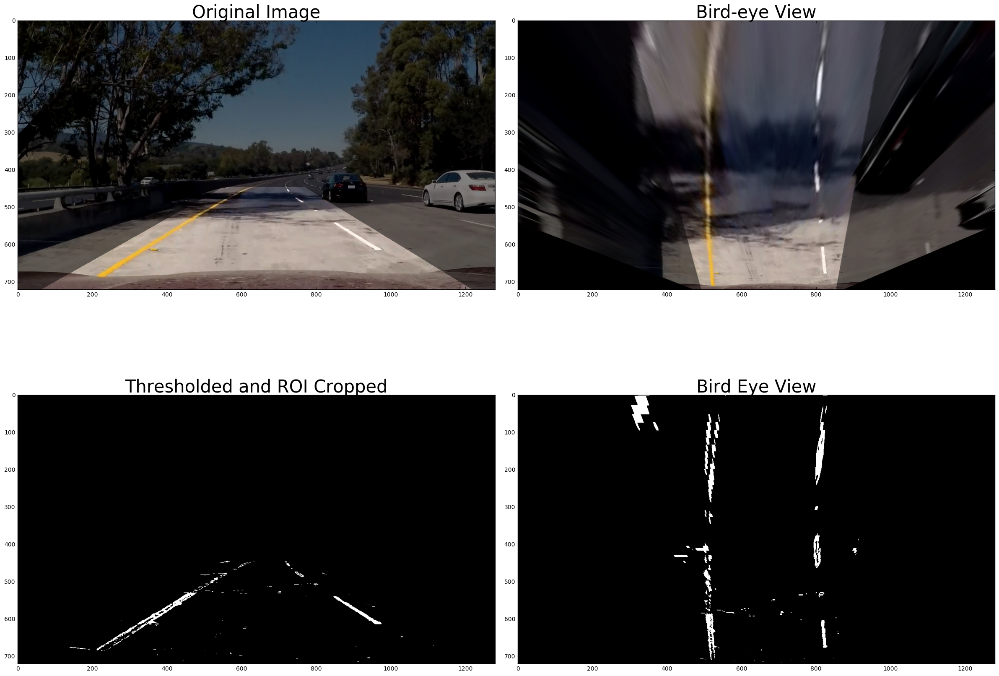

In [24]:
# Example using 1 image
frame = cv2.imread('./test_images/test7.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Perspective Transform
projmgr = ProjectionManager(cam_calibration, row, col,src, dst, offset=300)
# Image filtering
img_filter = ImageFilter(img_size)

# undst_img = cv2.undistort(frame, mtx, dst)
binary_img = img_filter.mix_color_grad_thresh(undst_img, s_thresh=(88, 255),  h_thresh=(150, 255), grad_thresh=(60, 150))
# Show what get transformed.
undst_roi = img_filter.region_of_interest(undst_img, projmgr.get_roi())
binary_roi = img_filter.region_of_interest(binary_img, projmgr.get_roi())
# Merge to original image
undst_img = cv2.addWeighted(undst_img, 0.5, undst_roi, 0.5, 0.0)
binary_img = cv2.addWeighted(binary_img, 0.5, binary_roi, 0.5, 0.0)

# Convert to Bird-eye view
undst_birdeye = projmgr.get_birdeye_view(undst_img)
binary_birdeye = projmgr.get_birdeye_view(binary_img)


# Display bir
f, ax = plt.subplots(2, 2, figsize=(24, 18))
f.tight_layout()
ax[0, 0].imshow(undst_img)
ax[0, 0].set_title('Original Image', fontsize=30)
ax[0, 1].imshow(undst_birdeye)
ax[0, 1].set_title('Bird-eye View', fontsize=30)
ax[1, 0].imshow(binary_img, cmap='gray')
ax[1, 0].set_title('Thresholded and ROI Cropped', fontsize=30)
ax[1, 1].imshow(binary_birdeye, cmap='gray')
ax[1, 1].set_title('Bird Eye View', fontsize=30)
plt.show()

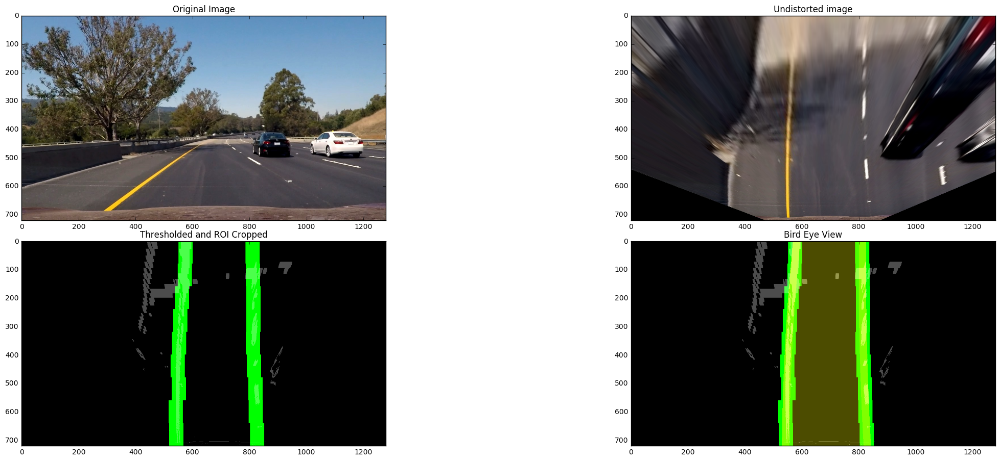

In [28]:
# Example using 1 image
frame = cv2.imread('./test_images/test6.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

projmgr = ProjectionManager(cam_calibration, row, col,src, dst, offset=300)
# undst_img = cv2.undistort(frame, mtx, dst)
undst_img = frame
binary_img = img_filter.mix_color_grad_thresh(undst_img, s_thresh=(88, 255),  h_thresh=(150, 255), grad_thresh=(60, 150))
binary_img = img_filter.region_of_interest(binary_img, projmgr.get_roi())  # FOcus on ROI only.
# Convert to bird eye view
birdeye_img = projmgr.get_birdeye_view(binary_img)
birdeye_undst = projmgr.get_birdeye_view(undst_img)

# Lane Fitting and Tracking
curve_centers = LineTracker(window_height=80, window_width=25, margin=30, ym=10/720, xm=4/384, smooth_factor=15)
# Sliding window
window_centroids = curve_centers.find_lane_line(warped=birdeye_img)
result, leftx, rightx = draw_windows(birdeye_img, w=25, h=80, window_centroids=window_centroids)

# Curve-fit
lane_lines,_, _ = curve_centers.curve_fit(result, leftx, rightx)

# Merge to original image
lane_lines = cv2.addWeighted(result, 1.0, lane_lines, 0.5, 0.0)
f, ax = plt.subplots(2, 2, figsize =(24,9))
f.tight_layout()
ax[0, 0].imshow(undst_img)
ax[0, 0].set_title('Original Image')
ax[0, 1].imshow(birdeye_undst)
ax[0, 1].set_title('Undistorted image')
ax[1, 0].imshow(result, cmap='gray')
ax[1, 0].set_title('Thresholded and ROI Cropped')
ax[1, 1].imshow(lane_lines)
ax[1, 1].set_title('Bird Eye View')
plt.show()

## 3. Diagnostic Screen

We had a clear way how to find lane line by applying perspective transform, sliding windows, and curve fittings. Next task is to convert it back to normal view. I created a debugging tool to make it easier where went wrong.

Camera Calibration data restored from ./camera_cal/calibration_mat.p


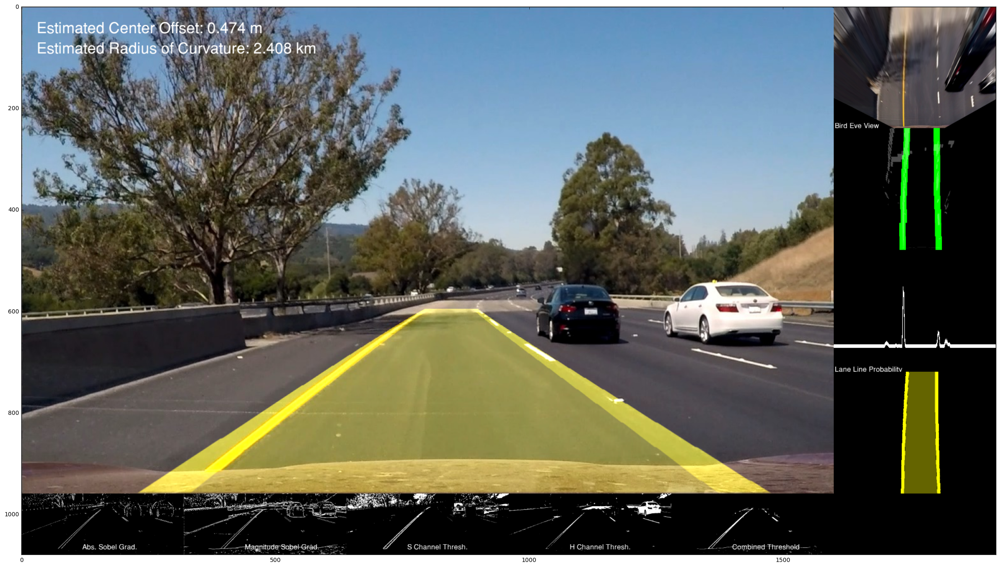

In [41]:
# Diagnostic Screen
diag_screen = DiagnosticMgr(img_filter, projmgr)

# Example using 1 image
frame = cv2.imread('./test_images/test6.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Camera Calibrator
cam_calibration = CameraCalibrator(p_file='./camera_cal/calibration_mat.p', img_dir=None)
mtx, dst, img_size = cam_calibration.get()

# Image filtering
img_filter = ImageFilter(img_size)

# Projection Manger
projmgr = ProjectionManager(cam_calibration, img_size[0], img_size[1], offset=300)

undst_img = cv2.undistort(frame, mtx, dst)
undst_img = frame
binary_img = img_filter.mix_color_grad_thresh(undst_img, s_thresh=(88, 255),  h_thresh=(150, 255), grad_thresh=(60, 150))
binary_img = img_filter.region_of_interest(binary_img, projmgr.get_roi())  # FOcus on ROI only.
# Convert to bird eye view
birdseye_img = projmgr.get_birdeye_view(binary_img)
birdseye_view = projmgr.get_birdeye_view(undst_img)

# Lane Fitting and Tracking
curve_centers = LineTracker(window_height=80, window_width=25, margin=30, ym=10/720, xm=4/384, smooth_factor=15)
# Sliding window
window_centroids = curve_centers.find_lane_line(warped=birdeye_img)
windows, leftx, rightx = draw_windows(birdeye_img, w=25, h=80, window_centroids=window_centroids)

# Curve-fit
curved_fit, curvature, offset = curve_centers.curve_fit(windows, leftx, rightx)

# Convert back to normal view
lane_lines = projmgr.get_normal_view(curved_fit)

# Merge to original image
lane_lines = cv2.addWeighted(undst_img, 1.0, lane_lines, 0.5, 0.0)

lane_lines = diag_screen.build(undst_img, lane_lines, binary_img, binary_roi,
                                       birdseye_img, birdseye_view, curved_fit, windows, curvature, offset)

a = plt.figure( figsize =(30, 20))
plt.imshow(lane_lines)
plt.show()

## MAIN PIPELINE

In [42]:
def process_image(frame):
    global cam_calibration
    global img_filter
    global projmgr
    global curve_centers
    global debug
    global diag_screen

    mtx, dst, size = cam_calibration.get()
    # Un-distort image
    undst_img = cv2.undistort(frame, mtx, dst)

    # Threshold image
    bin_img = img_filter.mix_color_grad_thresh(undst_img, s_thresh=(88, 250),  h_thresh=(120, 250))
    
    # Perspective Transform
    binary_roi = img_filter.region_of_interest(bin_img, projmgr.get_roi())
    birdseye_view = projmgr.get_birdeye_view(undst_img)
    birdseye_img = projmgr.get_birdeye_view(binary_roi)

    # Sliding window
    window_centroids = curve_centers.find_lane_line(warped=birdseye_img)
    windows, left_x, right_x = draw_windows(birdseye_img, w=25, h=80, window_centroids=window_centroids)

    # Curve-fit and calculate curvature and offset
    curved_fit, curvature, offset = curve_centers.curve_fit(windows, left_x, right_x)

    # Convert back to normal view
    lane_lines = projmgr.get_normal_view(curved_fit)

    # Merge to original image
    lane_lines = cv2.addWeighted(undst_img, 1.0, lane_lines, 0.5, 0.0)

    # Add diagnostic screen if user needs to debug
    if debug is True:
        lane_lines = diag_screen.build(undst_img, lane_lines, bin_img, binary_roi,
                                       birdseye_img, birdseye_view, curved_fit, windows, curvature, offset)

    return lane_lines

# Camera Calibrator
cam_calibration = CameraCalibrator(p_file='./camera_cal/calibration_mat.p', img_dir=None)
mtx, dst, img_size = cam_calibration.get()

# Image filtering
img_filter = ImageFilter(img_size)

# Projection Manger
projmgr = ProjectionManager(cam_calibration, img_size[0], img_size[1], offset=300)

# Lane Tracker
curve_centers = LineTracker(window_height=80, window_width=25, margin=30, ym=10 / 720, xm=4 / 384, smooth_factor=20)

# Debug
debug = True

diag_screen = DiagnosticMgr(img_filter, projmgr)
# Create output video
output = 'output3.mp4'
clip1 = VideoFileClip("./project_video.mp4").subclip(35, 42)
clip = clip1.fl_image(process_image)  # NOTE: this function expects color images!!
clip.write_videofile(output, audio=False)

Camera Calibration data restored from ./camera_cal/calibration_mat.p
[MoviePy] >>>> Building video output3.mp4
[MoviePy] Writing video output3.mp4


 99%|█████████▉| 175/176 [00:36<00:00,  4.84it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output3.mp4 




### Pipeline (video)

#### 1. Provide a link to your final video output.  Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!).

Here's a [link to my video result](https://www.youtube.com/watch?v=blezjtz1lWU)

---

### Discussion

#### 1. Briefly discuss any problems / issues you faced in your implementation of this project.  Where will your pipeline likely fail?  What could you do to make it more robust?

I made few assumptions in my pipeline that:

1. The camera angle is fixed. If the pitch of my camera position is changed, I need to update my the Prospective Transform Matrix

2. The parameters for Sobel Gradients and Color Gradients are well chosen for this project video. That is why my pipeline did not work very well on the challenge video. In the near future, I would like to upgrade the pipeline robustly to multiple scenarios. Imagine a heavy-snow road, this could be a really challenging task to approach the problem with this approach.
